Task-1

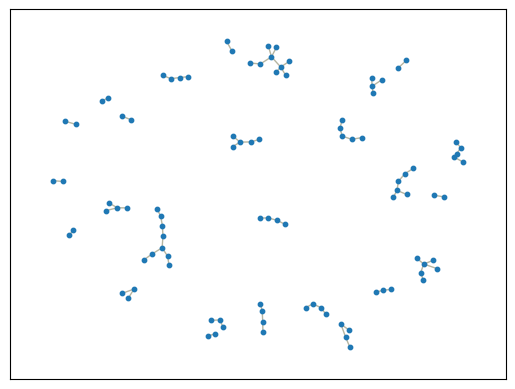

In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import random

m0 = 100
mf = 10000

m = 2

G = nx.Graph()
G.add_nodes_from(range(m0))

# Forming the initial random graph
for i in range(m0):
    if G.degree(i) == 0:
        j = random.randint(0, m0-1)
        while j == i or G.has_edge(i, j):
            j = random.randint(0, m0-1)
        G.add_edge(i, j)

nx.draw_networkx(G, with_labels=False, node_size=10, edge_color = '#b6b5a1')

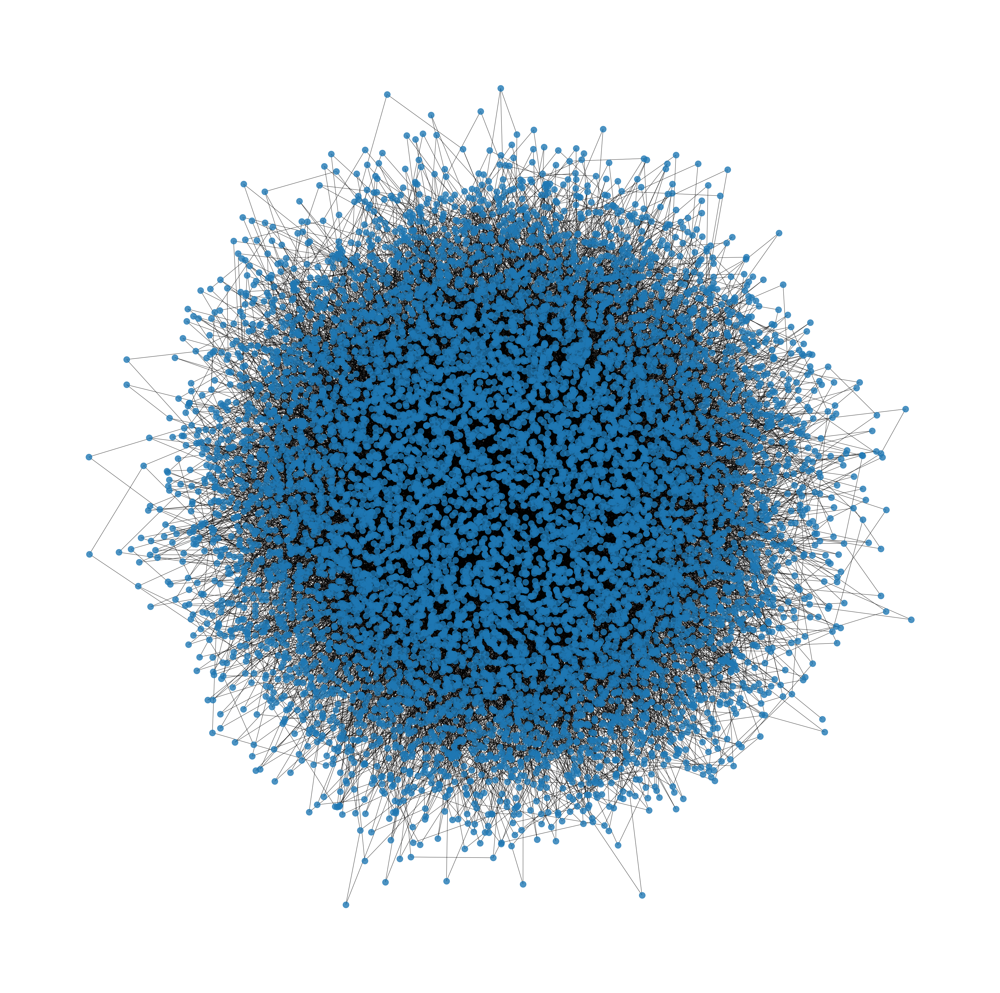

In [2]:
def find_m_nodes(seq, m):
    # return random.sample(seq, m)
    m_nodes = set()
    while len(m_nodes) < m:
        x = random.choice(seq)
        m_nodes.add(x)
    return m_nodes
    
repeated_nodes = [n for n, d in G.degree() for _ in range(d)]

curr = len(G)
while curr < mf:
    m_nodes = find_m_nodes(repeated_nodes, m)
    G.add_edges_from(zip([curr] * m, m_nodes))
    repeated_nodes.extend(m_nodes)
    repeated_nodes.extend([curr] * m)

    curr += 1

# plot the network
plt.figure(figsize=(50, 50))
nx.draw_networkx(G, with_labels=False, alpha = 0.8)
plt.axis('off')
plt.show()

In [ ]:
# !pip install pyvis

In [ ]:
# from pyvis.network import Network
# n = Network(notebook=True)
# n.from_nx(G)
# n.toggle_physics(True)
# n.show("network.html")

Task-2

In [3]:
deg_dt = {}
for n,d in G.degree():
  if d in deg_dt.keys():
    deg_dt[d] += 1/10000
  else:
    deg_dt[d] = 1/10000

myKeys = list(deg_dt.keys())
myKeys.sort()
deg_dt = {i: deg_dt[i] for i in myKeys}
print(deg_dt)

{1: 0.0004, 2: 0.4975999999999615, 3: 0.19649999999999468, 4: 0.10000000000000184, 5: 0.056600000000000594, 6: 0.035299999999999984, 7: 0.0254999999999999, 8: 0.01579999999999996, 9: 0.01259999999999998, 10: 0.009599999999999997, 11: 0.005700000000000002, 12: 0.006500000000000004, 13: 0.0049, 14: 0.004099999999999998, 15: 0.0037999999999999974, 16: 0.002799999999999999, 17: 0.0025999999999999994, 18: 0.0030999999999999986, 19: 0.0012000000000000003, 20: 0.0012000000000000003, 21: 0.0013000000000000004, 22: 0.0014000000000000004, 23: 0.0016000000000000005, 24: 0.0012000000000000003, 25: 0.0004, 26: 0.0009000000000000002, 27: 0.0004, 28: 0.0008000000000000001, 29: 0.0005, 30: 0.0007000000000000001, 31: 0.0001, 32: 0.0006000000000000001, 33: 0.0004, 34: 0.00030000000000000003, 35: 0.0001, 36: 0.00030000000000000003, 37: 0.0001, 38: 0.0004, 39: 0.0002, 40: 0.0001, 41: 0.0001, 42: 0.00030000000000000003, 43: 0.0001, 44: 0.0001, 46: 0.0002, 47: 0.0001, 49: 0.0001, 53: 0.0002, 54: 0.0002, 57:

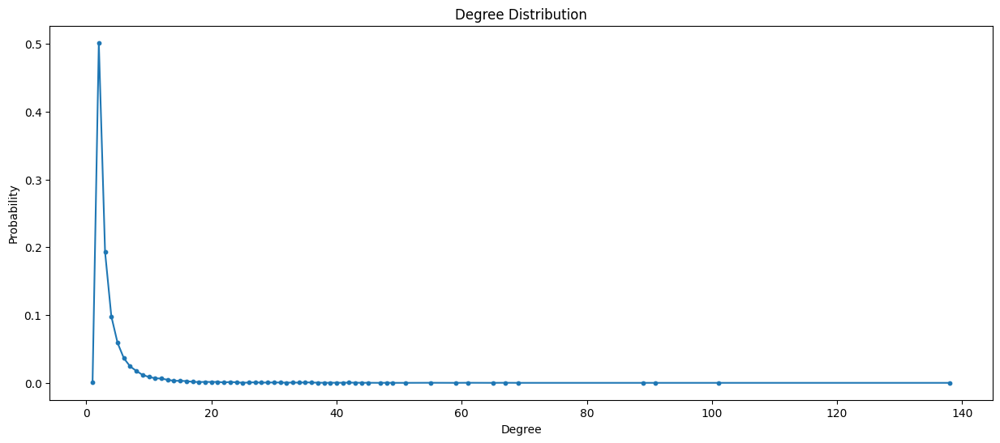

In [ ]:
plt.figure(figsize=(15,6))
plt.scatter(deg_dt.keys(),deg_dt.values(), s=10)
plt.plot(deg_dt.keys(), deg_dt.values())
plt.xlabel("Degree")
plt.ylabel("Probability")
plt.title("Degree Distribution")
plt.show()

In [ ]:
degrees = dict(G.degree())

max_degree_node = None
max_degree = -1
for node, degree in degrees.items():
    if degree > max_degree:
        max_degree = degree
        max_degree_node = node

print("Node with highest degree:", max_degree_node)
print("Highest degree:", max_degree)
print("Node with highest degree entered network at time interval:", max_degree_node)

Node with highest degree: 115
Highest degree: 237
Node with highest degree entered network at time interval: 115


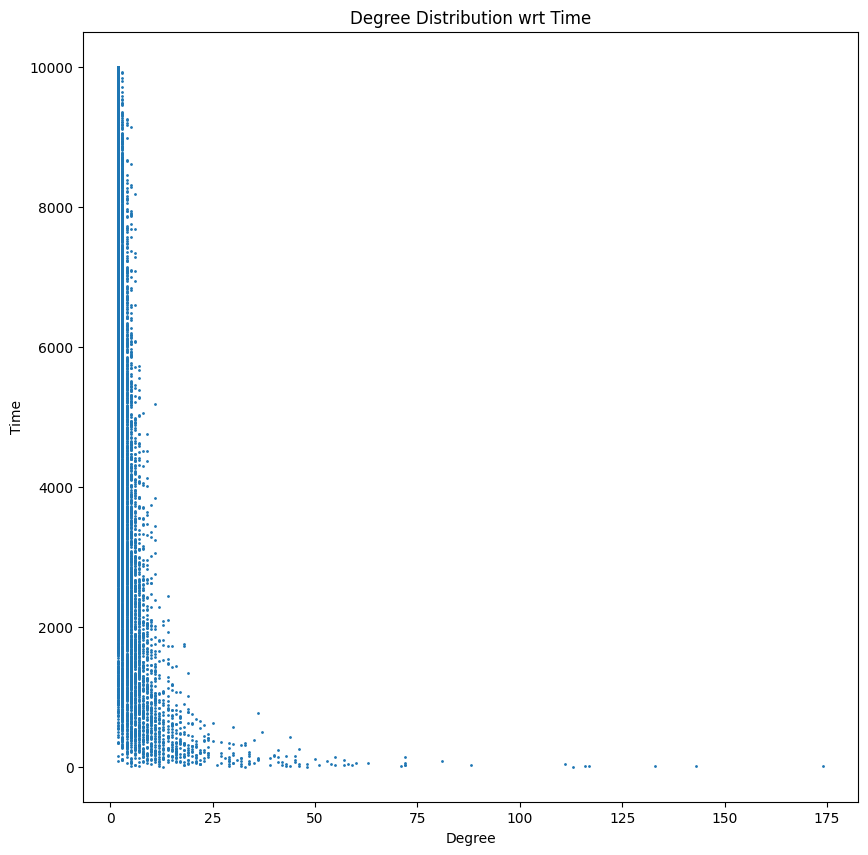

In [ ]:
# Get the degrees of all nodes
degrees = dict(G.degree())

# Plot the nodes and labels
plt.figure(figsize=(10,10))
plt.scatter(degrees.values(), degrees.keys(), s=1)
plt.xlabel('Degree')
plt.ylabel('Time')
plt.title('Degree Distribution wrt Time')
plt.show()

Task-3

In [ ]:
dc = nx.degree_centrality(G)
ec = nx.eigenvector_centrality_numpy(G)
kc = nx.katz_centrality_numpy(G, weight= 'weight')
pr = nx.pagerank(G, 0.3)
bc = nx.betweenness_centrality(G)
cc = nx.closeness_centrality(G)
print(dc,ec,pr,bc,cc,sep="\n\n")

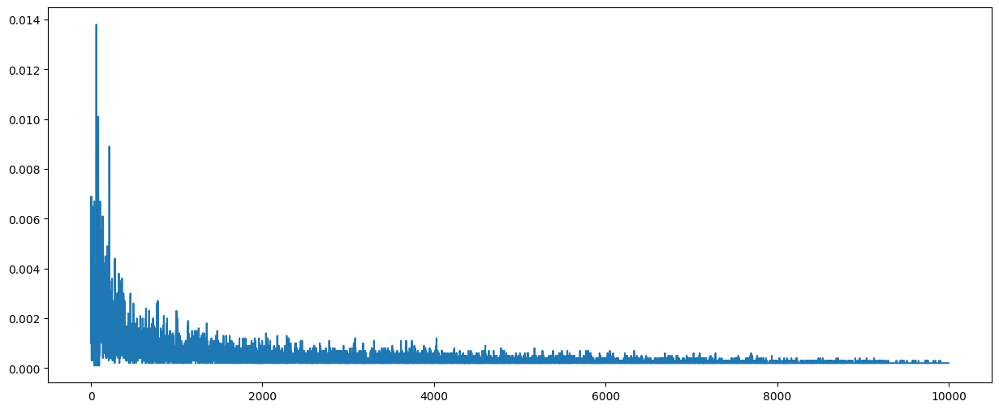

In [ ]:
plt.figure(figsize=(15,6))
# plt.scatter(kc.keys(),kc.values(), s=10)
plt.plot(dc.keys(),dc.values())
plt.show()

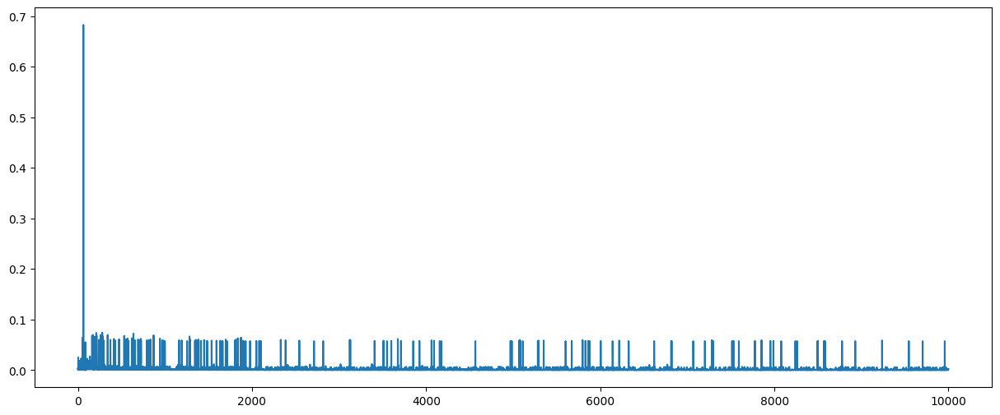

In [ ]:
plt.figure(figsize=(15,6))
# plt.scatter(kc.keys(),kc.values(), s=10)
plt.plot(ec.keys(),ec.values())
plt.show()

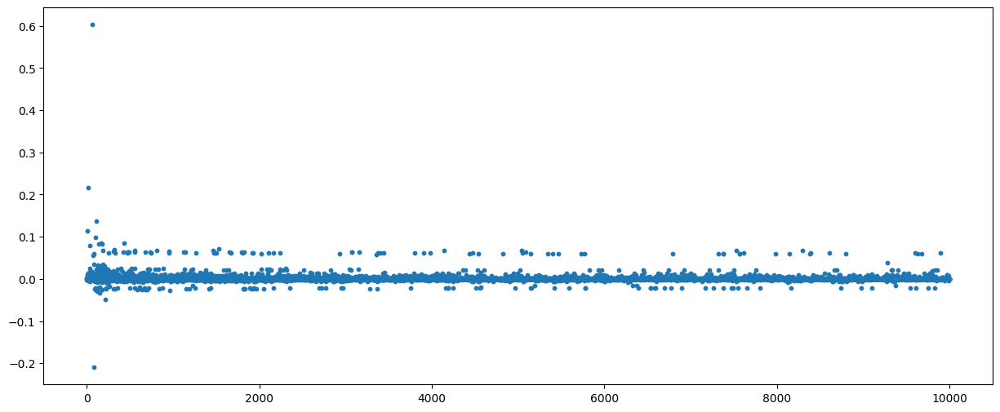

In [ ]:
plt.figure(figsize=(15,6))
plt.scatter(kc.keys(),kc.values(), s=10)
# plt.plot(kc.keys(),kc.values())
plt.show()

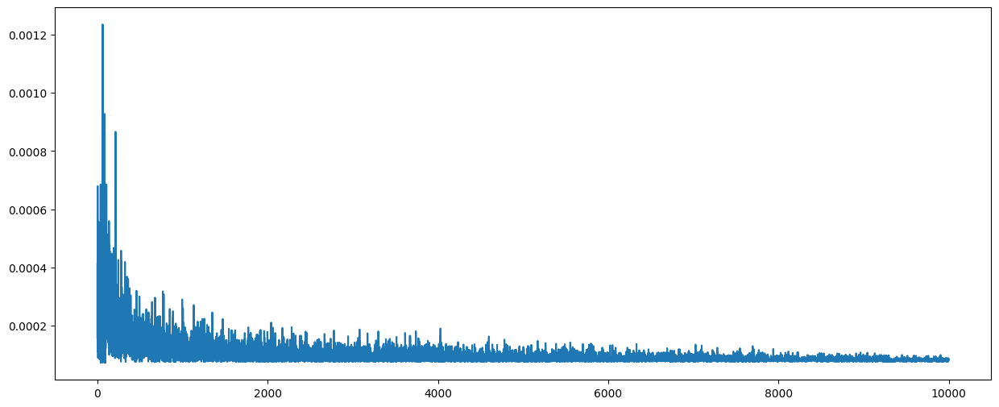

In [ ]:
plt.figure(figsize=(15,6))
# plt.scatter(kc.keys(),kc.values(), s=10)
plt.plot(pr.keys(),pr.values())
plt.show()

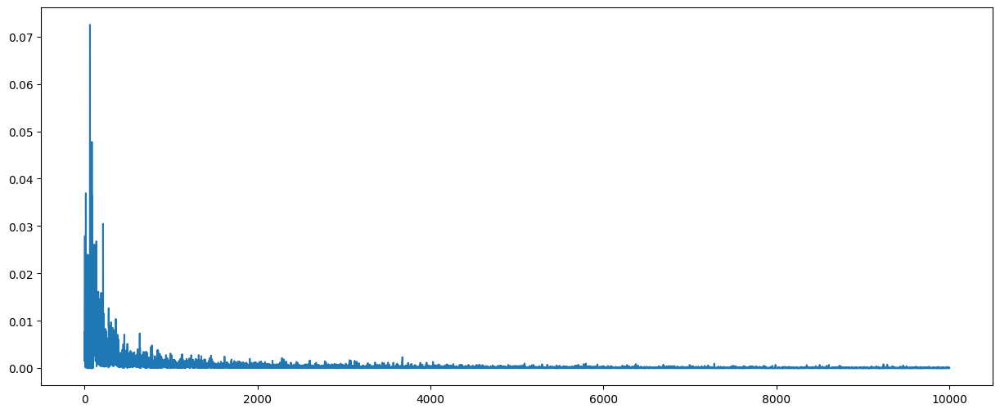

In [ ]:
plt.figure(figsize=(15,6))
# plt.scatter(kc.keys(),kc.values(), s=10)
plt.plot(bc.keys(),bc.values())
plt.show()

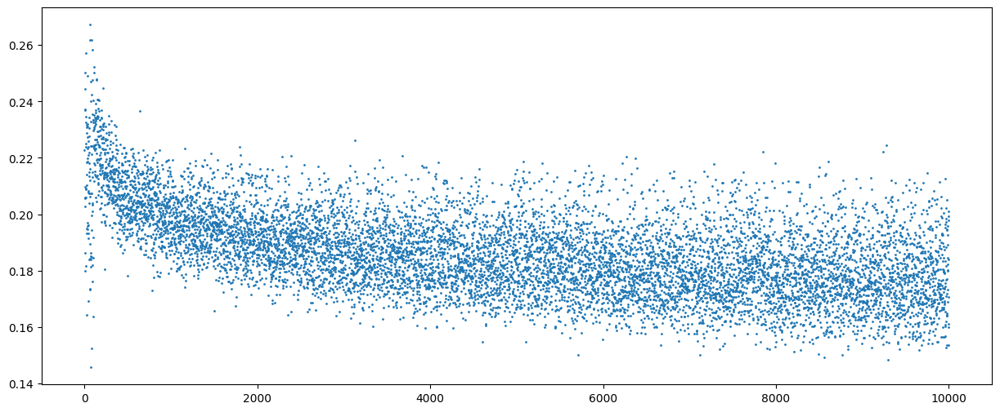

In [ ]:
plt.figure(figsize=(15,6))
plt.scatter(cc.keys(),cc.values(), s=1)
# plt.plot(cc.keys(),cc.values())/
plt.show()

In [ ]:
from collections import Counter

def top5(dct):
  k = Counter(dct)
  high = k.most_common(5)
  return list(dict(high).keys())

In [ ]:
from prettytable import PrettyTable
 
# Specify the Column Names while initializing the Table
myTable = PrettyTable(["First Node", "Second Node", "Third Node", "Fourth Node", "Fifth Node"])
 
# Add rows
myTable.add_row(top5(dc))
myTable.add_row(top5(ec))
myTable.add_row(top5(kc))
myTable.add_row(top5(pr))
myTable.add_row(top5(bc))
myTable.add_row(top5(cc))
myTable.add_column("Centrality",["Degree Centrality","EigenVector Centrality","Katz Centrality","PageRank","Betweenness Centrality","Closeness Centrality"])

print(myTable)

+------------+-------------+------------+-------------+------------+------------------------+
| First Node | Second Node | Third Node | Fourth Node | Fifth Node |       Centrality       |
+------------+-------------+------------+-------------+------------+------------------------+
|     63     |      85     |     62     |     214     |     4      |   Degree Centrality    |
|     63     |     280     |    211     |     638     |    173     | EigenVector Centrality |
|     62     |      15     |    114     |      3      |    107     |    Katz Centrality     |
|     63     |      85     |    214     |      62     |     38     |        PageRank        |
|     63     |      85     |     62     |      15     |     88     | Betweenness Centrality |
|     63     |      62     |     85     |      88     |     15     |  Closeness Centrality  |
+------------+-------------+------------+-------------+------------+------------------------+


Task-5

In [ ]:
print(nx.number_connected_components(G))

1


In [ ]:
CG = nx.connected_components(G)

In [ ]:
len(max(CG,key=len))/len(G)

1.0

Task-6

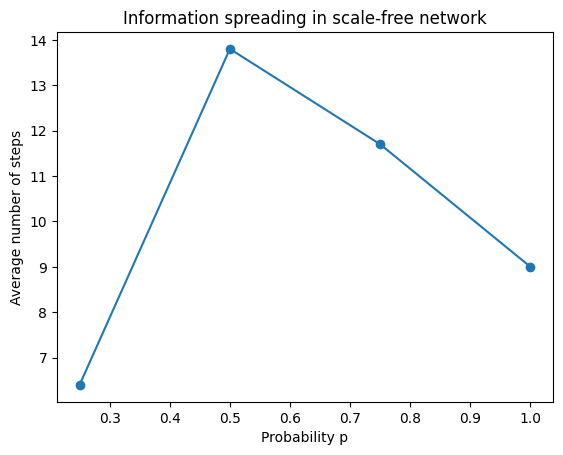

In [4]:
x = random.randint(0, mf-1)
probabilities = [0.25, 0.5, 0.75, 1]
avg_num_steps_list = [] 

for p in probabilities:
    num_steps_list = []
    for _ in range(10):
        state = {node: 0 for node in G.nodes()}
        queue = []
        queue.append(x)
        state[x] = 1
        num_steps = 0
        
        while queue:
            num_steps += 1
            sz = len(queue)
            for i in range(sz):
                node = queue.pop(0)
                for neighbor in G.neighbors(node):
                    if state[neighbor] == 0:
                        if random.random() < p:
                            state[neighbor] = 1
                            queue.append(neighbor)
        num_steps_list.append(num_steps)
    avg_num_steps = sum(num_steps_list) / len(num_steps_list)
    avg_num_steps_list.append(avg_num_steps)

# Plot the data
plt.plot(probabilities, avg_num_steps_list, '-o')
plt.xlabel('Probability p')
plt.ylabel('Average number of steps')
plt.title('Information spreading in scale-free network')
plt.show()